In [1]:
%pip install torch
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
from sklearn.model_selection import train_test_split
import numpy as np
import time

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


# Load data and split into training and testing sets

In [2]:
# Load data
X = np.load('data_processing/X_sequences.npy')
y = np.load('data_processing/y_labels.npy')

# original sequence was length of 86 which resulted in gradient vanishing in both RNN and LSTM models
X = X[:, :20, :] # shortened sequences for better learning performance

# Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    random_state=42)

# Convert to tensors and split into batches

The entire X shape has 58k sequences. Splitting into batches allows for faster training and better generalization

In [3]:
X_train = torch.FloatTensor(X_train) 
X_test = torch.FloatTensor(X_test)  
y_train = torch.FloatTensor(y_train).unsqueeze(1)
y_test = torch.FloatTensor(y_test).unsqueeze(1)

# create x,y pairs 
train_data = TensorDataset(X_train, y_train)

# split data into batches of 32
train_loader = DataLoader(
    train_data, 
    batch_size=32,    # Process 32 points at a time
    shuffle=True      # Randomize order each epoch
)

# same for test data
test_data = TensorDataset(X_test, y_test)
test_loader = DataLoader(test_data, batch_size=32) 
    
                        


# Test with RNN model

This is a many to one RNN model. It takes many shot sequences and predicts a binary outcome. Did the server win or lose. 

https://www.geeksforgeeks.org/machine-learning/introduction-to-recurrent-neural-network/

https://docs.pytorch.org/tutorials/beginner/introyt/modelsyt_tutorial.html

In [4]:
print(f"Train: {y_train.mean():.2%} server wins")
print(f"Test: {y_test.mean():.2%} server wins")

class RNNModel(nn.Module):
    def __init__(self, input_size, hidden_size):
        super().__init__() # initialize nn.Module
        
        # RNN model layer
        self.rnn = nn.RNN(input_size, hidden_size, batch_first=True)

        # compress hidden state to 32 features, then to binary output
        self.firstLayer = nn.Linear(hidden_size, 32)
        self.output = nn.Linear(32, 1)
        
    def forward(self, x):
        # h is final hidden state
        _, h = self.rnn(x)
        
        # relu adds non-linearity and sigmoid for binary output
        x = torch.relu(self.firstLayer(h.squeeze(0)))  
        x = torch.sigmoid(self.output(x))
        return x
    
from sklearn.metrics import accuracy_score, roc_auc_score, classification_report

# initialize model, loss function, optimizer
model = RNNModel(input_size=8, hidden_size=64)
loss_function = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01) # Adam optimizer updates weights

# Training loop
for epoch in range(50):
    model.train()
    for X_batch, y_batch in train_loader: # process each batch
        optimizer.zero_grad() # zero gradients
        outputs = model(X_batch) # forward pass
        loss = loss_function(outputs, y_batch) # compute loss
        loss.backward() # backpropagate
        print(f"RNN grad: {model.rnn.weight_ih_l0.grad.abs().mean():.6f}") # see why gradients arent flowing
        print(f"FC grad: {model.firstLayer.weight.grad.abs().mean():.6f}")  
        optimizer.step() # update weights

# evaluiate on test set
model.eval()
y_pred = []
y_pred_prob = []

# dont track gradients during eval
with torch.no_grad():
    for X_batch, _ in test_loader:
        outputs = model(X_batch)
        y_pred_prob.extend(outputs.cpu().numpy()) # store predicted probabilities
        predicted = (outputs > 0.5).float() # threshold at 0.5
        y_pred.extend(predicted.cpu().numpy()) # store predicted classes (0,1)

# convert lists to 1D
y_pred = [int(p[0]) for p in y_pred]
y_pred_prob = [p[0] for p in y_pred_prob]

# Evaluate
rnn_acc = accuracy_score(y_test, y_pred)
rnn_roc = roc_auc_score(y_test, y_pred_prob)

print(f"Accuracy: {rnn_acc:.3f}")
print(f"ROC-AUC:  {rnn_roc:.3f}")
print("\nClassification Report:\n", classification_report(y_test, y_pred))

Train: 60.94% server wins
Test: 61.21% server wins
RNN grad: 0.000307
FC grad: 0.000432
RNN grad: 0.000700
FC grad: 0.000822
RNN grad: 0.000880
FC grad: 0.000604
RNN grad: 0.000081
FC grad: 0.000366
RNN grad: 0.000183
FC grad: 0.000250
RNN grad: 0.000497
FC grad: 0.000352
RNN grad: 0.003818
FC grad: 0.002182
RNN grad: 0.005053
FC grad: 0.002180
RNN grad: 0.006679
FC grad: 0.001989
RNN grad: 0.005075
FC grad: 0.002755
RNN grad: 0.004590
FC grad: 0.001309
RNN grad: 0.025745
FC grad: 0.002324
RNN grad: 0.008658
FC grad: 0.004121
RNN grad: 0.009491
FC grad: 0.004226
RNN grad: 0.004774
FC grad: 0.001432
RNN grad: 0.001636
FC grad: 0.000465
RNN grad: 0.015872
FC grad: 0.002653
RNN grad: 0.018895
FC grad: 0.001574
RNN grad: 0.005682
FC grad: 0.004175
RNN grad: 0.018844
FC grad: 0.008233
RNN grad: 0.007985
FC grad: 0.002068
RNN grad: 0.002531
FC grad: 0.002281
RNN grad: 0.001655
FC grad: 0.002927
RNN grad: 0.001624
FC grad: 0.001480
RNN grad: 0.007059
FC grad: 0.002327
RNN grad: 0.002689
FC gr

/opt/anaconda3/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


The RNN gradients are 0.000 during training. This is preventing the model from learning any patterns in the shot sequences. Because there are 86 timesteps per sequence, gradients are multiplied 86 times during backpropogation. Most activation derivatives are <1, repeated multiplication  causes gradients to approach 0 before reaching early weights. This is causing the RNN layer to only predict 1s, the majority class. 

Even after shortening the sequence to 20 instead of 86, 

# LSTM MODEL

In [5]:
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size):
        super().__init__()
        
        # LSTM layer instead of RNN
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.firstLayer = nn.Linear(hidden_size, 32)
        self.output = nn.Linear(32, 1)
        
    def forward(self, x):
        # LSTM returns (h, c) - hidden state and cell state
        _, (h, c) = self.lstm(x)
        
        x = torch.relu(self.firstLayer(h.squeeze(0)))  
        x = torch.sigmoid(self.output(x))
        return x

# Initialize LSTM model
model = LSTMModel(input_size=8, hidden_size=64)
loss_function = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

# Training loop
for epoch in range(50):
    model.train()
    for X_batch, y_batch in train_loader:
        optimizer.zero_grad()
        outputs = model(X_batch)
        loss = loss_function(outputs, y_batch)
        loss.backward()
        
        # Check LSTM gradients 
        print(f"LSTM grad: {model.lstm.weight_ih_l0.grad.abs().mean():.6f}")
        print(f"FC grad: {model.firstLayer.weight.grad.abs().mean():.6f}")
        
        optimizer.step()

# Evaluate
model.eval()
y_pred = []
y_pred_prob = []

with torch.no_grad():
    for X_batch, _ in test_loader:
        outputs = model(X_batch)
        y_pred_prob.extend(outputs.cpu().numpy())
        predicted = (outputs > 0.5).float()
        y_pred.extend(predicted.cpu().numpy())

y_pred = [int(p[0]) for p in y_pred]
y_pred_prob = [p[0] for p in y_pred_prob]

# Evaluate
lstm_acc = accuracy_score(y_test, y_pred)
lstm_roc = roc_auc_score(y_test, y_pred_prob)

print(f"Accuracy: {lstm_acc:.3f}")
print(f"ROC-AUC:  {lstm_roc:.3f}")
print("\nClassification Report:\n", classification_report(y_test, y_pred))

LSTM grad: 0.000172
FC grad: 0.000372
LSTM grad: 0.000151
FC grad: 0.000213
LSTM grad: 0.000035
FC grad: 0.000156
LSTM grad: 0.000018
FC grad: 0.000027
LSTM grad: 0.000097
FC grad: 0.000185
LSTM grad: 0.000211
FC grad: 0.000218
LSTM grad: 0.000602
FC grad: 0.001144
LSTM grad: 0.000207
FC grad: 0.000568
LSTM grad: 0.000442
FC grad: 0.000520
LSTM grad: 0.001218
FC grad: 0.001321
LSTM grad: 0.002116
FC grad: 0.000780
LSTM grad: 0.000626
FC grad: 0.000606
LSTM grad: 0.001342
FC grad: 0.000987
LSTM grad: 0.000682
FC grad: 0.001687
LSTM grad: 0.001068
FC grad: 0.000719
LSTM grad: 0.000456
FC grad: 0.000824
LSTM grad: 0.000095
FC grad: 0.000187
LSTM grad: 0.000100
FC grad: 0.000416
LSTM grad: 0.000156
FC grad: 0.000610
LSTM grad: 0.000427
FC grad: 0.000510
LSTM grad: 0.000132
FC grad: 0.000641
LSTM grad: 0.000228
FC grad: 0.000550
LSTM grad: 0.000676
FC grad: 0.000161
LSTM grad: 0.001376
FC grad: 0.000557
LSTM grad: 0.000958
FC grad: 0.000497
LSTM grad: 0.000692
FC grad: 0.001106
LSTM grad: 0

Originally, I trained this model with the full 86 length sequence and a learning rate of 0.001. This was also resulting in a vanishing gradient problem, similar to the RNN model. I shortened the sequence and adjusted the learning rate to 0.01 and accuracy went up to 99%!


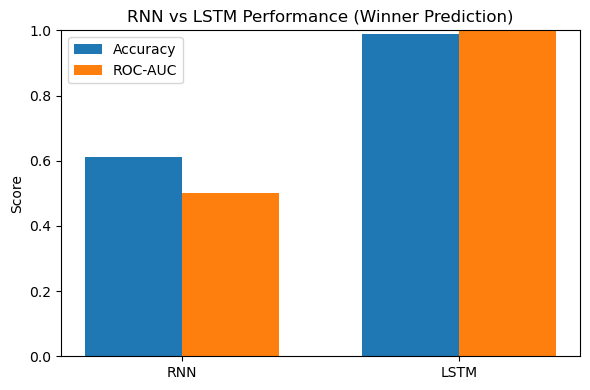

In [6]:
import matplotlib.pyplot as plt
models = ["RNN", "LSTM"]
accs = [rnn_acc, lstm_acc]
rocs = [rnn_roc, lstm_roc]

x = np.arange(len(models))
width = 0.35

plt.figure(figsize=(6,4))
plt.bar(x - width/2, accs, width, label="Accuracy")
plt.bar(x + width/2, rocs, width, label="ROC-AUC")
plt.xticks(x, models)
plt.ylim(0, 1.0)
plt.ylabel("Score")
plt.title("RNN vs LSTM Performance (Winner Prediction)")
plt.legend()
plt.tight_layout()
plt.show()

In [7]:
from sklearn.metrics import accuracy_score, roc_auc_score, classification_report

# Train LSTM model
model = LSTMModel(input_size=8, hidden_size=64)
loss_function = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

# Training loop (no prints for clean output)
for epoch in range(200):
    model.train()
    for X_batch, y_batch in train_loader:
        optimizer.zero_grad()
        outputs = model(X_batch)
        loss = loss_function(outputs, y_batch)
        loss.backward()
        optimizer.step()

# Predict on test data
model.eval()
y_pred = []
y_pred_prob = []

with torch.no_grad():
    for X_batch, _ in test_loader:
        outputs = model(X_batch)
        y_pred_prob.extend(outputs.cpu().numpy())
        predicted = (outputs > 0.5).float()
        y_pred.extend(predicted.cpu().numpy())

y_pred = [int(p[0]) for p in y_pred]
y_pred_prob = [p[0] for p in y_pred_prob]

# Evaluate
acc = accuracy_score(y_test, y_pred)
roc = roc_auc_score(y_test, y_pred_prob)

print(f"Accuracy: {acc:.3f}")
print(f"ROC-AUC:  {roc:.3f}")
print("\nClassification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.612
ROC-AUC:  0.500

Classification Report:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00      5690
         1.0       0.61      1.00      0.76      8980

    accuracy                           0.61     14670
   macro avg       0.31      0.50      0.38     14670
weighted avg       0.37      0.61      0.46     14670



/opt/anaconda3/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
